## 最長共通部分列問題
Least Common Subsequence (LCS) \
https://ja.wikipedia.org/wiki/最長共通部分列問題

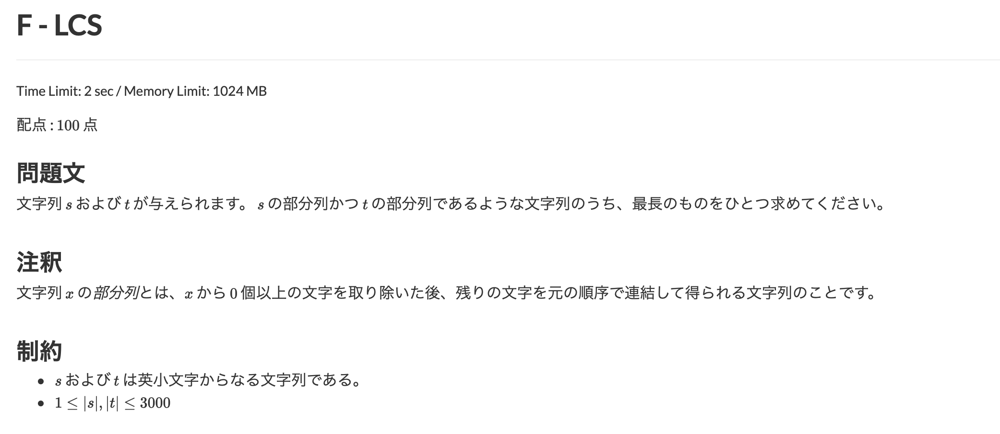

In [1]:
from IPython.display import Image
Image("img/AtCoder_F_1.png",width=1000,height=500)

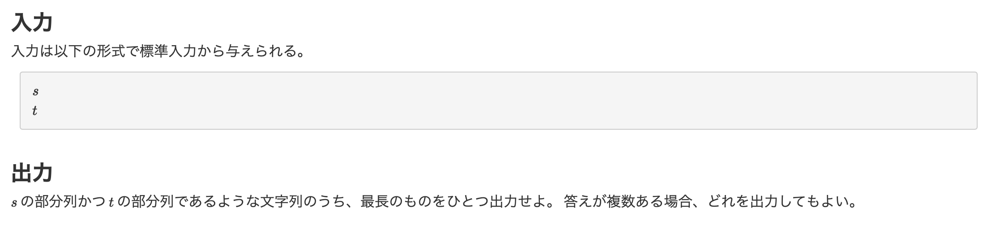

In [2]:
Image("img/AtCoder_F_2.png",width=1000,height=500)

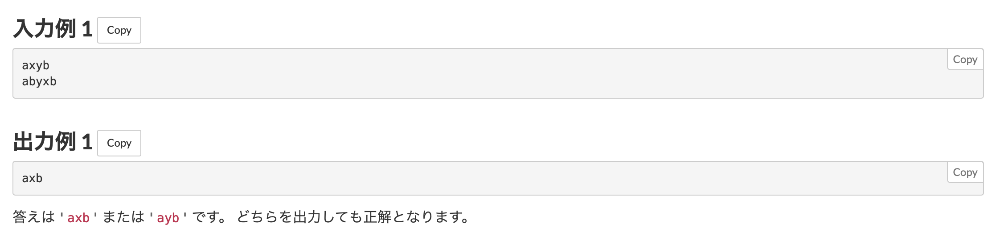

In [3]:
Image("img/AtCoder_F_3.png",width=1000,height=500)

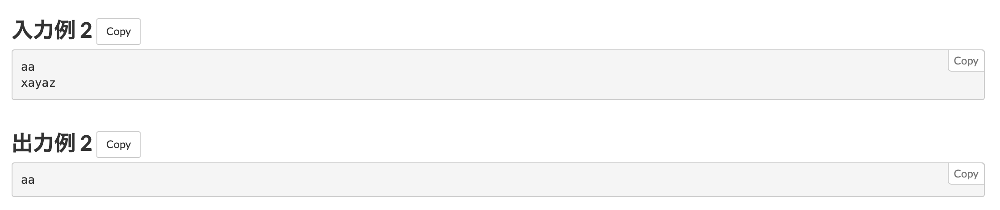

In [4]:
Image("img/AtCoder_F_4.png",width=1000,height=500)

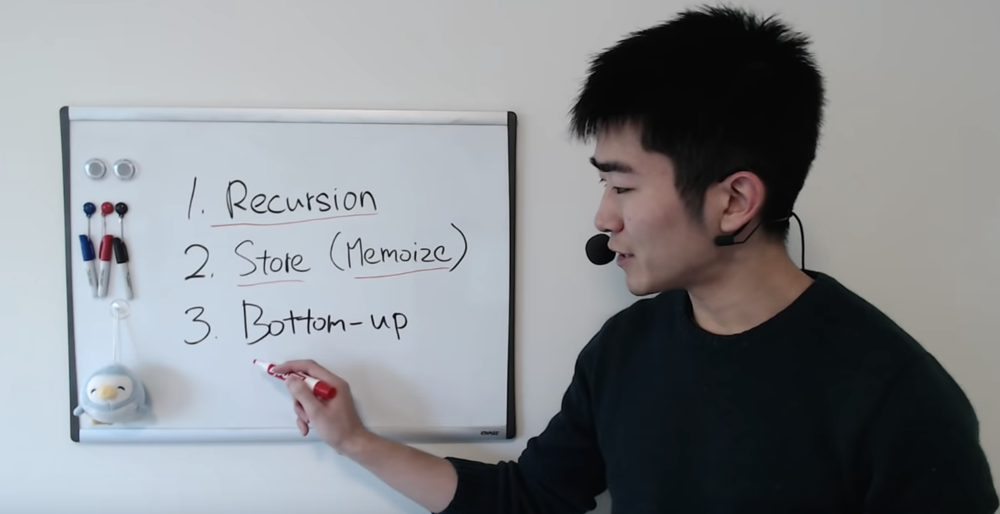

In [5]:
Image("img/approach.png",width=1000,height=500)

## 再帰解答

In [6]:
import timeit

def LCS(X, Y, n, m):
    
    if n == 0 or m == 0:
        return 0
    elif X[n-1] == Y[m-1]:
        return 1 + LCS(X,Y,n-1,m-1)
    else:
        tmp1 = LCS(X,Y,n-1,m)
        tmp2 = LCS(X,Y,n,m-1)
        result = max(tmp1,tmp2)
    
    return result

In [7]:
X = 'axyb'
Y = 'abyxb'
start = timeit.default_timer() 
print(LCS(X,Y,4,5))
stop = timeit.default_timer() 
print("Time: %.3g" % (stop - start))

3
Time: 0.000259


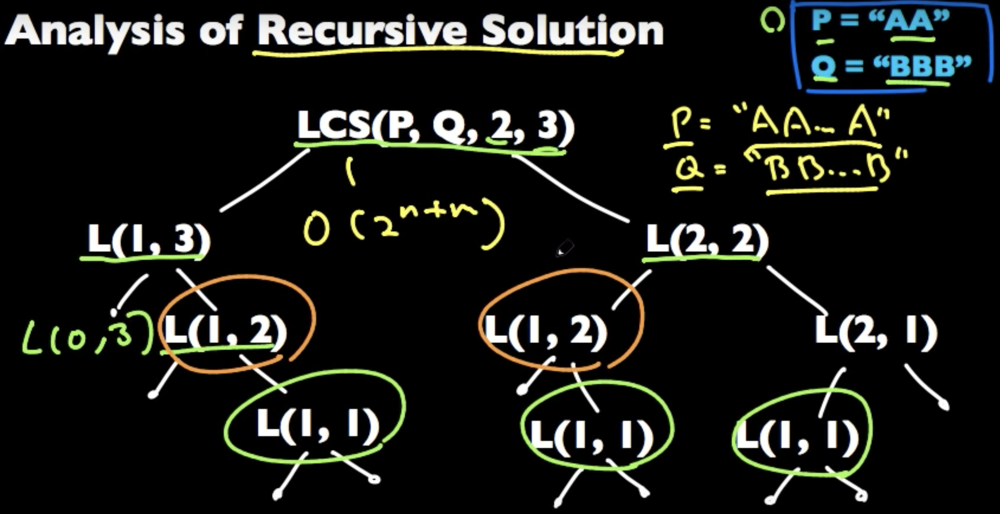

In [8]:
Image("img/LCS_recursive_analysis.png",width=500,height=500)

## メモ化
Top-Bottomアプローチ \
(2,3) -> (0,0)

In [9]:
arr = [[None for x in range(100)] for y in range(100)] 

def LCS_memo(X, Y, n, m):
    
    if arr[n][m] != None:
        return arr[n][m]
    
    if n == 0 or m == 0:
        return 0
    elif X[n-1] == Y[m-1]:
        return 1 + LCS(X,Y,n-1,m-1)
    else:
        tmp1 = LCS(X,Y,n-1,m)
        tmp2 = LCS(X,Y,n,m-1)
        result = max(tmp1,tmp2)
    
    arr[n][m] = result
    
    return result

In [10]:
X = 'axyb'
Y = 'abyxb'
start = timeit.default_timer() 
print(LCS_memo(X,Y,4,5))
stop = timeit.default_timer() 
print("Time: %.3g" % (stop - start))

3
Time: 0.000422


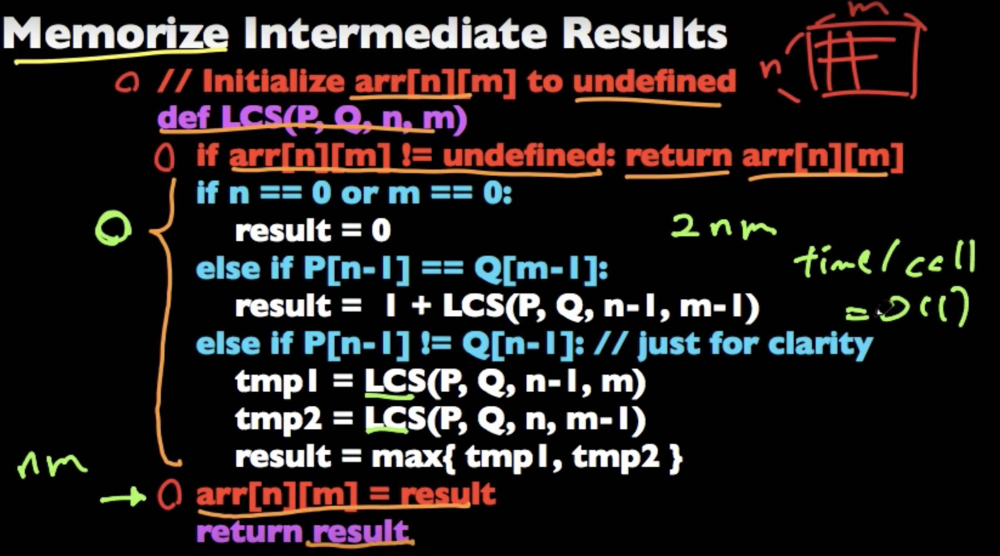

In [11]:
Image("img/LCS_memo.png",width=500,height=500)

## DP
Bottom-Upアプローチ \
(0,0) -> (2,3)

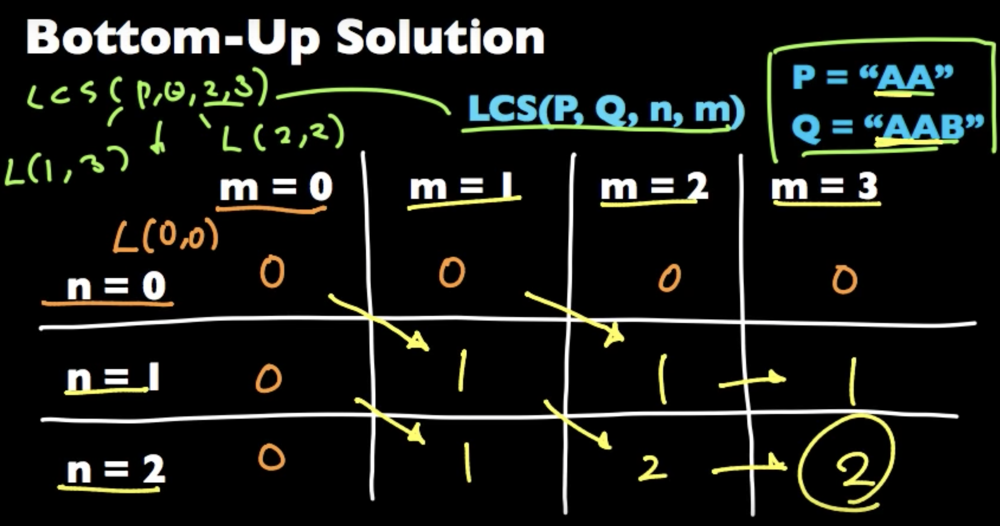

In [12]:
Image("img/LCS_dp.png",width=500,height=500)

In [13]:
import numpy as np

def LCS_bottom_up(X,Y):
    
    n = len(X)
    m = len(Y)
    
    L = [[None for y in range(m+1)] for x in range(n+1)]
    
    
    for i in range(n+1):
        for j in range(m+1):
            if i == 0 or j == 0:
                L[i][j] = 0
            elif X[i-1] == Y[j-1]:
                L[i][j] = 1 + L[i-1][j-1]
            else:
                tmp1 = L[i-1][j]
                tmp2 = L[i][j-1]
                L[i][j] = max(tmp1,tmp2)
                
    print(np.matrix(L))        
    return L[n][m]

In [14]:
X = 'axyb'
Y = 'abyxb'
start = timeit.default_timer() 
print(LCS_bottom_up(X,Y))
stop = timeit.default_timer() 
print("Time: %.3g" % (stop - start))

[[0 0 0 0 0 0]
 [0 1 1 1 1 1]
 [0 1 1 1 2 2]
 [0 1 1 2 2 2]
 [0 1 2 2 2 3]]
3
Time: 0.000817


### LCSの文字列を出力

In [15]:
def LCS_bottom_up_print(X,Y):
    
    n = len(X)
    m = len(Y)
    
    L = [[None for y in range(m+1)] for x in range(n+1)]
    
    for i in range(n+1):
        for j in range(m+1):
            if i == 0 or j == 0:
                L[i][j] = 0
            elif X[i-1] == Y[j-1]:
                L[i][j] = 1 + L[i-1][j-1]
            else:
                tmp1 = L[i-1][j]
                tmp2 = L[i][j-1]
                L[i][j] = max(tmp1,tmp2)
      
    # Following code is used to print LCS 
    # 文字列の長さ
    index = L[n][m]
    
    # Create a character array to store the lcs string 
    lcs = [""] * (index+1) 
    
    # Start from the right-most-bottom-most corner and 
    # one by one store characters in lcs[] 
    # Start from the right-most-bottom-most corner and 
    # one by one store characters in lcs[] 
    i = n 
    j = m 
    while i > 0 and j > 0: 
  
        # If current character in X[] and Y are same, then 
        # current character is part of LCS 
        if X[i-1] == Y[j-1]: 
            lcs[index-1] = X[i-1] 
            i-=1
            j-=1
            index-=1
  
        # If not same, then find the larger of two and 
        # go in the direction of larger value 
        elif L[i-1][j] > L[i][j-1]: 
            i-=1
        else: 
            j-=1
  
    print("LCS of " + X + " and " + Y + " is " + "".join(lcs))

In [16]:
X = 'axyb'
Y = 'abyxb'
start = timeit.default_timer() 
print(LCS_bottom_up_print(X,Y))
stop = timeit.default_timer() 
print("Time: %.3g" % (stop - start))

LCS of axyb and abyxb is ayb
None
Time: 0.000638


In [1]:
def LCS_bottom_up_print(X,Y):
    
    n = len(X)
    m = len(Y)
    
    L = [[None for y in range(m+1)] for x in range(n+1)]
    
    for i in range(n+1):
        for j in range(m+1):
            if i == 0 or j == 0:
                L[i][j] = 0
            elif X[i-1] == Y[j-1]:
                L[i][j] = 1 + L[i-1][j-1]
            else:
                tmp1 = L[i-1][j]
                tmp2 = L[i][j-1]
                L[i][j] = max(tmp1,tmp2)
      
    # Following code is used to print LCS 
    # 文字列の長さ
    index = L[n][m]
    
    # Create a character array to store the lcs string 
    lcs = [""] * (index+1) 
    
    # Start from the right-most-bottom-most corner and 
    # one by one store characters in lcs[] 
    # Start from the right-most-bottom-most corner and 
    # one by one store characters in lcs[] 
    i = n 
    j = m 
    while i > 0 and j > 0: 
  
        # If current character in X[] and Y are same, then 
        # current character is part of LCS 
        if X[i-1] == Y[j-1]: 
            lcs[index-1] = X[i-1] 
            i-=1
            j-=1
            index-=1
  
        # If not same, then find the larger of two and 
        # go in the direction of larger value 
        elif L[i-1][j] > L[i][j-1]: 
            i-=1
        else: 
            j-=1
  
    return "".join(lcs)
  
X=input()
Y=input()
LCS_bottom_up_print(X,Y)

axyb
abyxb


'ayb'

In [2]:
X=input()
Y=input()
LCS_bottom_up_print(X,Y)

aa
xayaz


'aa'

In [3]:
X=input()
Y=input()
LCS_bottom_up_print(X,Y)

a
z


''

In [4]:
X=input()
Y=input()
LCS_bottom_up_print(X,Y)

abracadabra
avadakedavra


'aaadara'

In [5]:
X=input()
Y=input()
LCS_bottom_up_print(X,Y)

aaa
aaa


'aaa'